In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D #für 3D Plots
from io import StringIO

# Lorenz' Atmosphärenmodell

\begin{equation}
\phi_X^{n+1} = \phi_X^n + \Delta t~(-\sigma X~+~\sigma Y)
\end{equation}

\begin{equation}
\phi_Y^{n+1} = \phi_Y^n + \Delta t~(-XZ~+~rZ~-~Y)
\end{equation}

\begin{equation}
\phi_Z^{n+1} = \phi_Z^n + \Delta t~(XY~-~bZ)
\end{equation}

\begin{equation}
\frac{d\vec{x}}{dt}=f_D(\vec{x}) ~ + ~ f_K(\vec{x})
\end{equation}

In [2]:
def lorenz_func(x,y,z,sig=10,r=28,b=8/3):
    """
    Parameter:
    ----------
    x : velocity
    y : temperature
    z : thermal stratification
    sig : Prantl number
    r : Rayleigh number
    b : Aspekt number
    Returns:
    -------
    np.array([dx,dy,dz])
    """
    return np.array([sig*(-x + y),-y + x*(r - z), -b*z + x*y])

### Konservativen Anteils
\begin{equation}
H(x,y,z) ~=~ \frac{1}{2} ~ y^2 ~+~ \frac{1}{2} ~ z^2 ~-~ rz
\end{equation}

\begin{equation}
C(x,y,z) ~=~ \frac{1}{2} ~ x^2 ~-~\sigma z
\end{equation}



\begin{equation}
H(x,y,z) ~=~ \frac{1}{2} ~ y^2 ~+~ \frac{1}{2} ~ z^2
\end{equation}

\begin{equation}
C(x,y,z) ~=~ \frac{1}{2} ~ x^2
\end{equation}

In [3]:
#Erhaltungsgrößen
def conservation_func(x,y,z,r,sig, kind='vor'):
    """
    Parameter:
    ----------
    x : velocity
    y : temperature
    z : thermal stratification
    sig : Prantl number
    r : Rayleigh number
    kind : vor => Vorlesung
    Returns:
    -------
    np.array([H,C])
    """
    if kind=='vor':
        return np.array([0.5*y*y + 0.5*z*z - r*z, 0.5*x*x - sig*z])
    else: 
        return np.array([0.5*y*y + 0.5*z*z, 0.5*x*x])

### dy/dz and dx/dz

In [4]:
def dydz_func (y,z,r):
    return (r-z)/y

def dxdz_func (x,sig):
    return x/sig

### Betrachtung des linearisierten Systems

\begin{align*}
\dot{x} \,&=\, \sigma (y - x)\\
\dot{y} \,&=\, rx - y \\
\dot{z} \,&=\, - bz \\
\end{align*}

$\Rightarrow$ z entkoppelt z(t$\rightarrow \infty $)=0

\begin{equation}
\left( \begin{array}{r}\dot{x} \\ \dot{y}\\ \end{array}
\right) \,=\,
\left( 
\begin{array}{rr}
-\sigma & \sigma \\
r & -1 \\
\end{array}
\right)
\left( \begin{array}{r}
x \\ y\\
\end{array}
\right)
\end{equation}

$\Rightarrow spur(M) = -\sigma -1$

$\Rightarrow det(M) = \sigma(r -1)$

### Dissipativen Anteil

\begin{equation}
f_D(\vec{x})~=~-~
\begin{bmatrix}
\sigma & 0 & 0 \\
0 & 1 & 0 \\
0 & 0 & b
\end{bmatrix}
\cdot
\begin{bmatrix}
x \\
y \\
z
\end{bmatrix}
\end{equation}

### Fixpunkte

\begin{equation}
	\frac{dx}{dt} \,=\, \frac{dy}{dt} \,=\, \frac{dz}{dt} \,=\, 0
\end{equation}

\begin{align*}
0 \,&=\, \sigma y - \sigma x \quad\quad \rightarrow X \,=\, Y\\
0 \,&=\, -xz+rx-y \quad\quad \rightarrow Z \,=\, r-1\\
0 \,&=\, xy-bz \quad\quad \rightarrow X=Y \,=\, \sqrt{b(r-1)}\\
\end{align*}


In [5]:
def fix_func(sig,r,b):
    """
    Parameter:
    ----------
    sig : Prantl number
    r : Rayleigh number
    b : Aspekt number
    Returns:
    -------
    fix points as tuple(np.array,np.array)
    """
    Z=r-1
    if b*(r-1) >= 0.0:
        XY=np.sqrt(b*(r-1))
        return (np.array([XY,XY,r-1]), np.array([-XY,-XY,r-1]))
    else:
        return (np.array([0,0,0]),np.array([0,0,0]))

### Stabilität der Fixpunkte

+ für 1 < r < $r_H$ ⇒ lineare Stabilität
+ für r = $r_H$ ⇒ subkritische Hopfbifurkation
+ für r > $r_H$ ⇒ instabile Grenzzyklen um die Fixpunkte
\begin{equation}
	 r_H \,=\, \frac{\sigma ( \sigma + b + 3 )}{\sigma − b − 1}
\end{equation}

In [6]:
def rho_crit(sig,b):
    """
    Parameter:
    ----------
    sig : Prantl number
    b : Aspekt number
    Returns:
    -------
    critical Rayleigh number
    """
    return (sig*(sig+b+3))/(sig-b-1)

### Plot-Funktionen

In [7]:
def plot_lorenz (res_lk,sig,b,r,n,dt,kind,fac=3):
    dim = np.shape(res_lk)
    
    #fig = plt.figure(figsize=(15,13))
    fig = plt.figure(figsize=(15*fac,13*fac))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(res_lk[0,:], res_lk[1,:], res_lk[2,:])
    ax.scatter(res_lk[0,dim[1]-1], res_lk[1,dim[1]-1], res_lk[2,dim[1]-1], s=200*fac,c='r', marker='o', lw=2.0, label='Starpunkt')#, depthshade=True)
    ax.scatter(res_lk[0,0], res_lk[1,0], res_lk[2,0], s=200*fac,c='orange', marker='o', label='Endpunkt')
    
    #fixpunkte
    fix_points = fix_func(sig,r,b)

    ax.scatter(xs=fix_points[0][0],ys=fix_points[0][1],zs=fix_points[0][2], s=200*fac,c='m', marker='o', label='fixpunkt')
    ax.scatter(xs=fix_points[1][0],ys=fix_points[1][1],zs=fix_points[1][2], s=200*fac,c='m', marker='o', label='fixpunkt')

    plt.annotate("Lorenz-Attraktor", xy=(0.43, 0.96), xycoords='axes fraction',fontsize=15*fac)
    if kind == "euler":
        plt.annotate("Euler Einschritt", xy=(0.43, 0.92), xycoords='axes fraction',fontsize=13*fac)
    elif kind == "runge" or kind == "rk":
        plt.annotate("Runge Kutta", xy=(0.43, 0.92), xycoords='axes fraction',fontsize=13*fac)

    text1 = r"Prandtl-Zahl ($\sigma$) : %.1f" % (sig)
    text2 = "Aspekt-Zahl (b) : %.1f" % (b)
    text3 = "Rayleigh-Zahl (r) : %.1f" % (r)     
    plt.annotate(text1, xy=(0.01, 0.9), xycoords='axes fraction',fontsize=15*fac)
    plt.annotate(text2, xy=(0.01, 0.86), xycoords='axes fraction',fontsize=15*fac)
    plt.annotate(text3, xy=(0.01, 0.82), xycoords='axes fraction',fontsize=15*fac)
    plt.annotate("Verfahren: " + kind, xy=(0.01, 0.1), xycoords='axes fraction',fontsize=15*fac)
    plt.annotate("Anzahl: " + str(n), xy=(0.01, 0.06), xycoords='axes fraction',fontsize=15*fac)
    plt.annotate("Timesteps: " + str(dt), xy=(0.01, 0.02), xycoords='axes fraction',fontsize=15*fac)
    #lt.annotate("Anfangspunkt: magenta Kreuz", xy=(0.71, 0.9), xycoords='axes fraction',fontsize=14*fac)
    #lt.annotate("Endpunkt: rotes Kreuz", xy=(0.71, 0.87), xycoords='axes fraction',fontsize=14*fac)
    ax.set_xlim3d(-25,25)
    ax.set_ylim3d(-30,30)
    ax.set_zlim3d(0,55)
    ax.set_xlabel('Geschwindigkeit',fontsize=15*fac)
    ax.set_ylabel('Temperatur',fontsize=15*fac)
    ax.set_zlabel('Temperaturschichtung',fontsize=15*fac)
    ax.legend(loc='best',fontsize=14*fac)
    #plt.show()
    plt.savefig("lorenz_" + kind + ".png")
    #plt.close()
    
    plot_erhaltung1(res_lk[3,:],res_lk[4,:])

    
def plot_erhaltung1(H,C):
    fig, ax = plt.subplots(figsize=(14,8))
    x=np.arange(0,np.size(H),1)
    
    ax.plot(x,H,'b-',label='H',lw=0.9)
    ax.plot(x,C,'r-',label='C',lw=0.9)
    
    #y = np.zeros(np.size(x[7300:7800]))-395
    #ax.plot(x[7300:7800],y,'g-',lw=1.9)
    #y = np.zeros(np.size(x[1860:1990]))-100
    #ax.plot(x[1860:1990],y,'g-',lw=1.9)
    ax.set_xlabel("Time")
    ax.legend()
    plt.title("Erhaltungsgrößen des konservativen Anteils")
    #plt.show()
    #plt.close()
    
def plot_xyz(X,Y):
    fig, ax = plt.subplots(figsize=(15,13))
    ax.plot(X,Y,'b-',lw=0.9)
    ax.set_xlim(-25,25)
    ax.set_ylim(-30,32)
    ax.set_xlabel('Geschwindigkeit')
    ax.set_ylabel('Temperatur')
    plt.show()
    

### Euler-Einschritt

In [8]:
def lorenz_euler (x_0=10,y_0=0,z_0=0,sig=10,r=28,b=8/3,ttime=100.0,dt=0.01):
    """
    Parameter:
    ----------
    startwerte: x_0,y_0,z_0
    sig: Prandtl-Zahl
    r: Rayleigh-Zahl
    b: Aspekt-Zahl
    ttime: total time
    dt: steps/schrittweite
    """
    
    #Iterationen
    n = int(ttime/dt)
    
    res = np.zeros((5,n),dtype=np.float128)

    res[0,0] = x_0
    res[1,0] = y_0
    res[2,0] = z_0
    res[3:5,0] = conservation_func(x_0,y_0,z_0,r,sig, kind='vor')

    i=1
    while(i<n):
        res[0:3,i] = res[0:3,i-1] + dt * lorenz_func(res[0,i-1],res[1,i-1],res[2,i-1],sig,r,b)
        res[3:5,i] = conservation_func(res[0,i],res[1,i],res[2,i],r,sig, kind='vor')
        i += 1
    
    plot_lorenz (res,sig,b,r,n,dt,"euler")

### Quellcode Runge-Kutta

In [9]:
def lorenz_rk (x_0=10,y_0=0,z_0=0,sig=10,r=28,b=8/3,ttime=100.0,dt=0.01):
    """
    Parameter:
    ----------
    startwerte: x_0,y_0,z_0
    sig: Prandtl-Zahl
    r: Rayleigh-Zahl
    b: Aspekt-Zahl
    ttime: total time
    dt: steps/schrittweite
    """
    
    #Iterationen
    n = int(ttime/dt)
    
    res = np.zeros((5,n),dtype=np.float128)

    res[0,0] = x_0
    res[1,0] = y_0
    res[2,0] = z_0
    res[3:5,0] = conservation_func(x_0,y_0,z_0,r,sig, kind='vor')

    dt2  = (dt/2.0)
    dt_6 = (dt/6.0)
    i=1
    while(i<n):
        K1 = lorenz_func(res[0,i-1],res[1,i-1],res[2,i-1],sig,r,b)
        K2 = lorenz_func(res[0,i-1]+(dt2*K1[0]),res[1,i-1]+(dt2*K1[1]),res[2,i-1]+(dt2*K1[2]),sig,r,b)
        K3 = lorenz_func(res[0,i-1]+(dt2*K2[0]),res[1,i-1]+(dt2*K2[1]),res[2,i-1]+(dt2*K2[2]),sig,r,b)
        K4 = lorenz_func(res[0,i-1]+(dt*K3[0]),res[1,i-1]+(dt*K3[1]),res[2,i-1]+(dt*K3[2]),sig,r,b)
        res[0:3,i] = res[0:3,i-1] + dt_6 * (K1 +2*K2 + 2*K3 + K4)
        res[3:5,i] = conservation_func(res[0,i],res[1,i],res[2,i],r,sig, kind='vor')
        i += 1
        
        
    plot_lorenz (res,sig,b,r,n,dt,"rk")



# Results

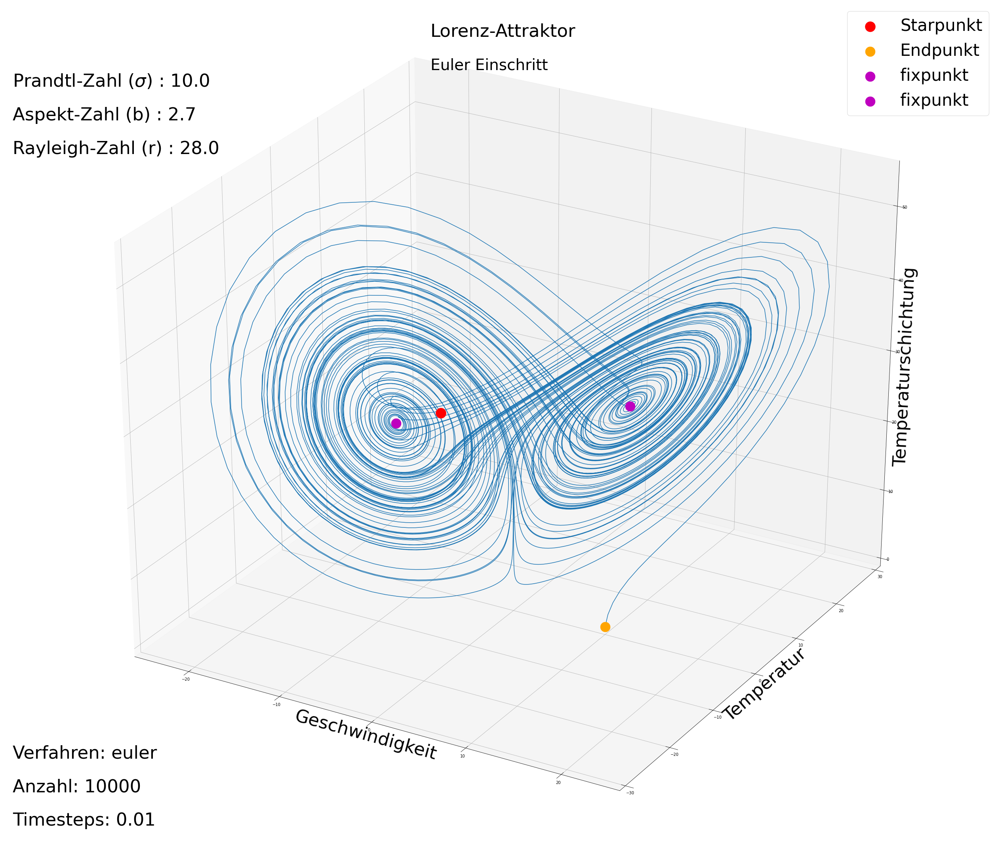

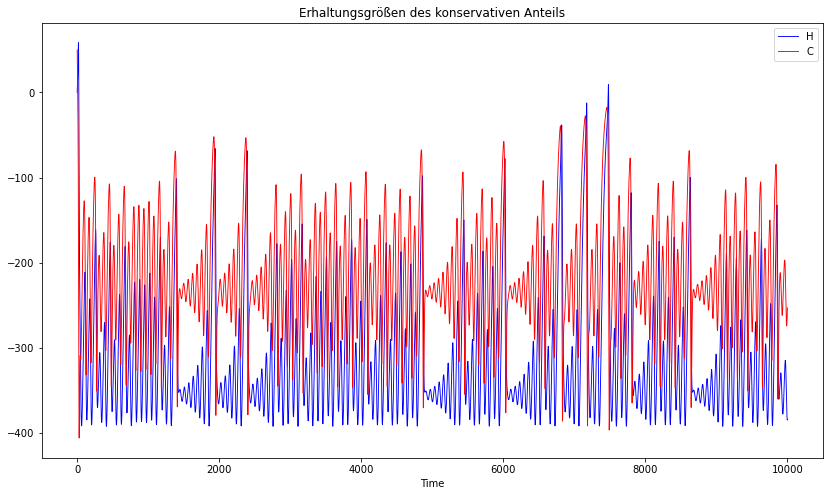

In [10]:
lorenz_euler()

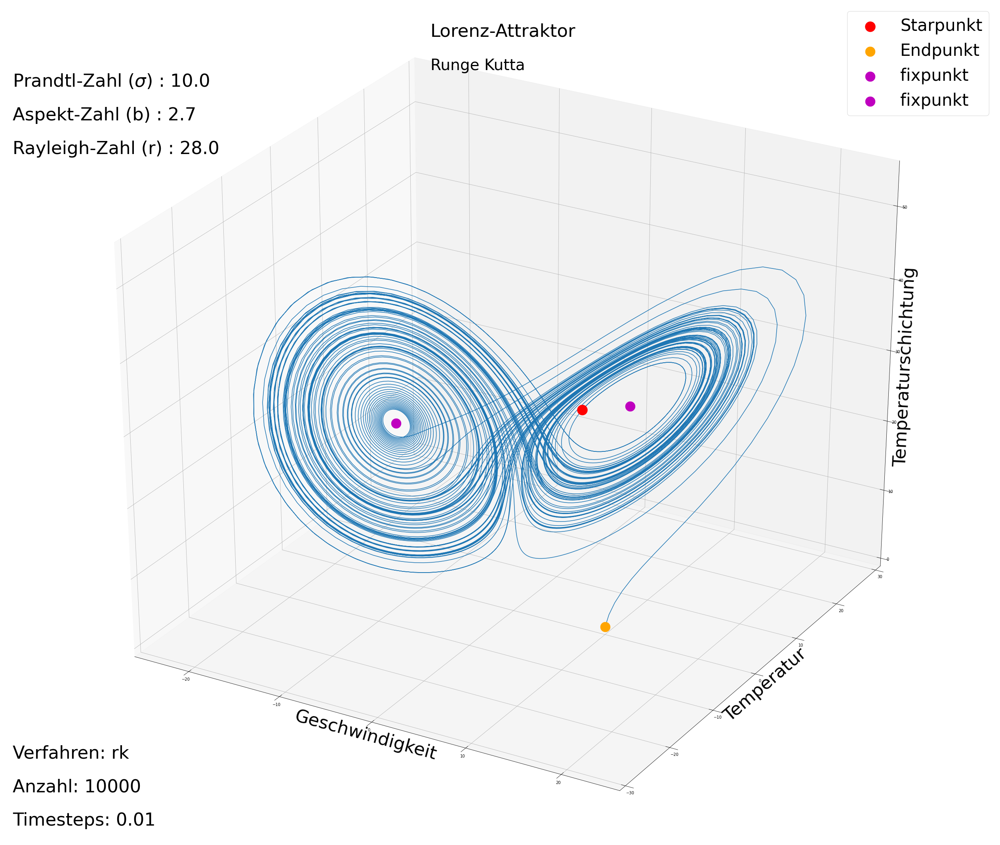

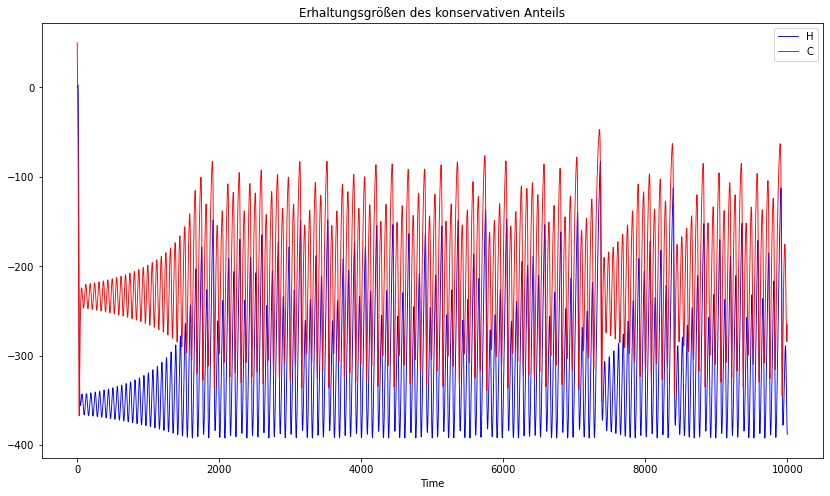

In [11]:
lorenz_rk()

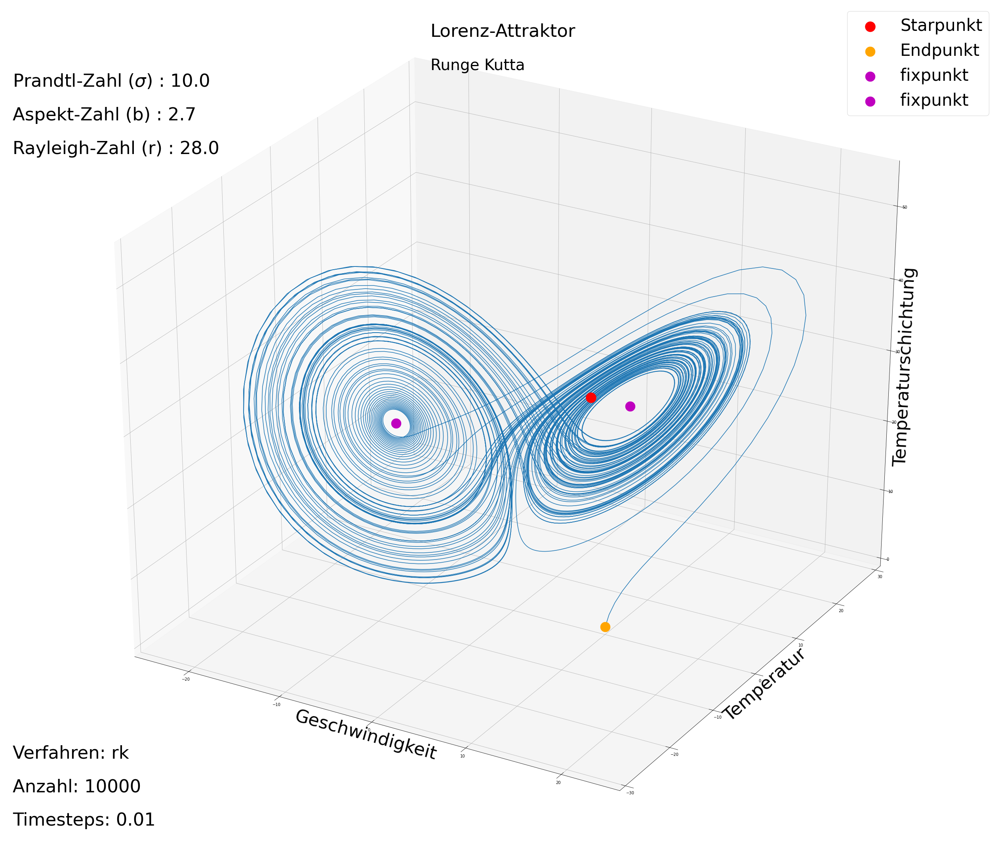

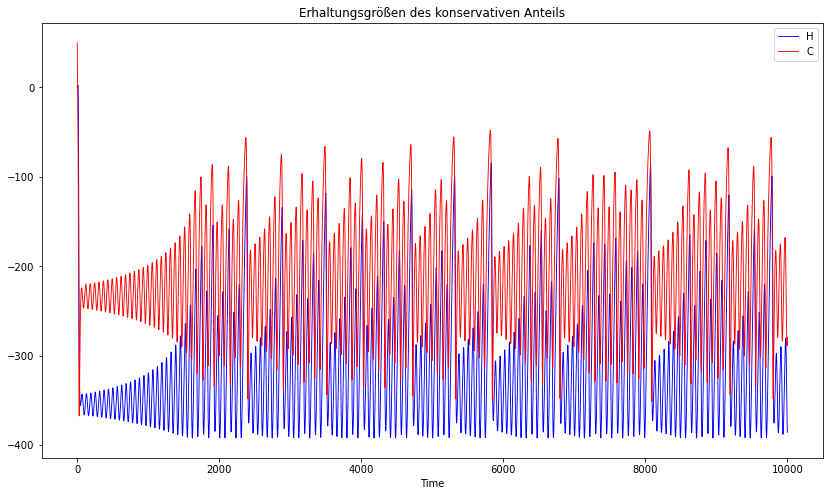

In [12]:
lorenz_rk(x_0=10.01,y_0=0,z_0=0)

## Divergenz im Phasenraum

sensible Abhängigkeit von Anfangsbedingungen



Das zugehörige Vektorfeld ist $ f = (-\sigma x + \sigma y, -y + rx -xz, -bz + xy)$. 

Damit ist $ \mathrm{div} \; f = - \sigma  -1 -b \ne 0.$

Nach dem Satz von Liouville ist das Phasenraumvolumen nicht erhalten.


exponentielle Bahnänderung numerisch ermittelt
$ \Rightarrow  \Vert \delta(t) \Vert \sim \Vert \delta_0 \Vert e^{\lambda t}  $

mit $\lambda$ : positiver Ljapunow Exponent


In [13]:
def lorenz_div (xyz_0=np.array([10,0,0]),sig=10,r=28,b=8/3,dn=2):
    """
    Parameter:
    ----------
    x : velocity
    y : temperature
    z : thermal stratification
    sig : Prantl number
    r : Rayleigh number
    b : Aspekt number
    dn: Skip results 
    Returns:
    -------
    np.array([x,y,z,i])
    """
    res = np.zeros((3,n),dtype=np.float128)

    res[:,0] = xyz_0

    i=1
    while(i<n):
        res[:,i] = res[:,i-1] + delta_t * lorenz_func(res[0,i-1],res[1,i-1],res[2,i-1],sig,r,b)
        i += 1
    
    return res[:,::dn]

In [14]:
def norm_div (res_div,ref_vec):
    """
    Calculation of the distance between a refenz attractor 
    and a ensemble of attractors with tiny changes of the initial conditions.
    
    Parameter:
    ----------
    res_div : ensemble of attractors
    ref_vec : refenz attractor

    Returns:
    -------
    np.array of shape (25, 5000)
    """
    return np.sum((ref_vec-res_div[:,:,:])**2,axis=1) #(25, 5000)

In [18]:
ttime=100.0
delta_t=0.01
   
#Iterationen
n = int(ttime/delta_t)

In [19]:
dx=0.0005
x_0 = 20
y_0 = -20
z_0 = 10
x_0,y_0 = np.meshgrid(np.arange(x_0 - 0.001,x_0 +0.001,dx),np.arange(y_0 - 0.001,y_0 +0.001,dx))
xyz_0 = np.array([x_0.flatten(),y_0.flatten(),z_0+np.zeros(np.size(y_0))])

dn=2
res_div = np.zeros((np.shape(xyz_0)[1],3,int(n/dn)))
i=0
for i in range(0,np.shape(xyz_0)[1]):
    res_div[i,:,:] = lorenz_div(xyz_0[:,i])
    print("Done with : ",xyz_0[:,i])

Done with :  [ 19.999 -20.001  10.   ]
Done with :  [ 19.9995 -20.001   10.    ]
Done with :  [ 20.    -20.001  10.   ]
Done with :  [ 20.0005 -20.001   10.    ]
Done with :  [ 20.001 -20.001  10.   ]
Done with :  [ 19.999  -20.0005  10.    ]
Done with :  [ 19.9995 -20.0005  10.    ]
Done with :  [ 20.     -20.0005  10.    ]
Done with :  [ 20.0005 -20.0005  10.    ]
Done with :  [ 20.001  -20.0005  10.    ]
Done with :  [ 19.999 -20.     10.   ]
Done with :  [ 19.9995 -20.      10.    ]
Done with :  [ 20. -20.  10.]
Done with :  [ 20.0005 -20.      10.    ]
Done with :  [ 20.001 -20.     10.   ]
Done with :  [ 19.999  -19.9995  10.    ]
Done with :  [ 19.9995 -19.9995  10.    ]
Done with :  [ 20.     -19.9995  10.    ]
Done with :  [ 20.0005 -19.9995  10.    ]
Done with :  [ 20.001  -19.9995  10.    ]
Done with :  [ 19.999 -19.999  10.   ]
Done with :  [ 19.9995 -19.999   10.    ]
Done with :  [ 20.    -19.999  10.   ]
Done with :  [ 20.0005 -19.999   10.    ]
Done with :  [ 20.001 -19

<ipython-input-20-fa9a424e0c38>:2: RuntimeWarning: divide by zero encountered in log
  delta = np.log(norm_div (res_div,res_div[12,:,:]))


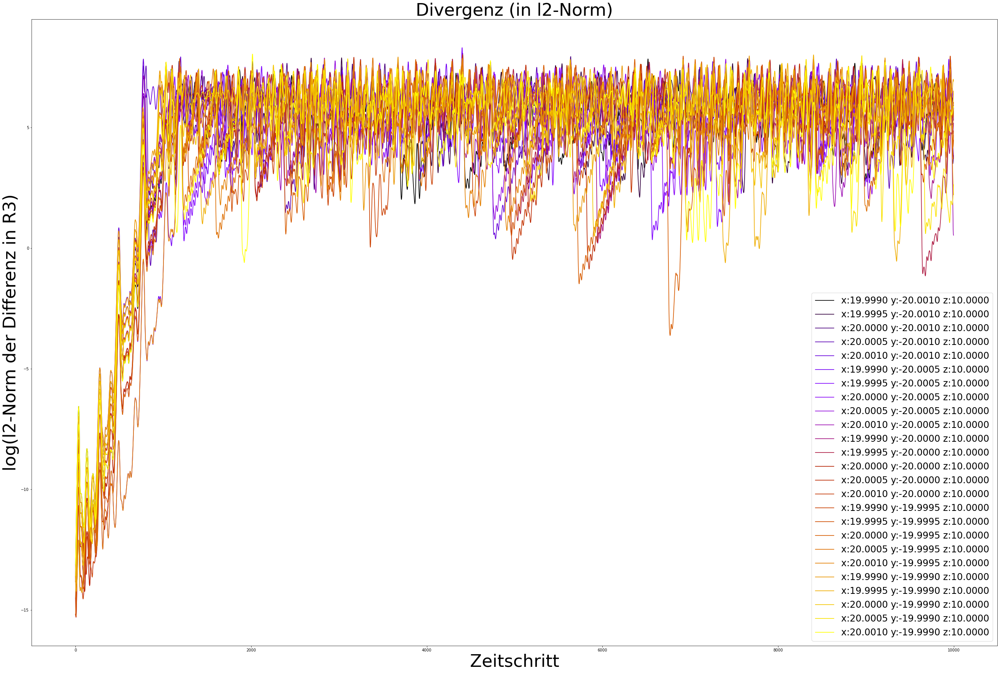

In [20]:
dim = np.shape(xyz_0)
delta = np.log(norm_div (res_div,res_div[12,:,:]))
x = np.arange(0,n,dn)
color=iter(plt.cm.gnuplot(np.linspace(0,1,dim[1])))
fac=3

fig = plt.figure(figsize=(15*fac,10*fac))

for i in range(0,dim[1]):
    plt.plot(x,delta[i,:],'-',c=next(color),lw=1.7,label="x:%.4f y:%.4f z:%.4f" %(xyz_0[0,i],xyz_0[1,i],xyz_0[2,i]))
#plt.label.set_size(40)
plt.title('Divergenz (in l2-Norm)',fontsize=15*fac)
plt.xlabel('Zeitschritt',fontsize=15*fac)
plt.ylabel('log(l2-Norm der Differenz in R3)',fontsize=15*fac)
plt.legend(loc='best',fontsize=8*fac)
plt.show()


In [21]:
def div_points (res_div,sig=10,r=28,b=8/3,dn=2):
    dim =np.shape(res_div)
    fig = plt.figure(figsize=(15,13))
    ax = fig.add_subplot(111, projection='3d')
    
    a = np.linspace(0.5,0.95,dim[2])
    #cmap = mpl.colors.LinearSegmentedColormap.from_list("", ["green","yellow","orange","red","darkred","darkmagenta"])#,N=len(liste))
    color=iter(plt.cm.winter(np.linspace(0,1,dim[2])))
                  
    plt.annotate("Divergenz der Trajektorien", xy=(0.33, 0.95), xycoords='axes fraction',fontsize=15)
    text1 = r"Prandtl-Zahl ($\sigma$) : %.1f" % (sig)
    text2 = "Aspekt-Zahl (b) : %.1f" % (b)
    text3 = "Rayleigh-Zahl (r) : %.1f" % (r)     
    plt.annotate(text1, xy=(0.01, 0.9), xycoords='axes fraction',fontsize=15)
    plt.annotate(text2, xy=(0.01, 0.86), xycoords='axes fraction',fontsize=15)
    plt.annotate(text3, xy=(0.01, 0.82), xycoords='axes fraction',fontsize=15)
    plt.annotate("Anfangspunkt: magenta", xy=(0.71, 0.9), xycoords='axes fraction',fontsize=14)
    plt.annotate("Endpunkt: rot", xy=(0.71, 0.87), xycoords='axes fraction',fontsize=14)
    ax.set_xlim3d(-25,25)
    ax.set_ylim3d(-30,30)
    ax.set_zlim3d(0,55)
    ax.set_xlabel('Geschwindigkeit')
    ax.set_ylabel('Temperatur')
    ax.set_zlabel('Temperaturschichtung')
    ax.legend()
    
    #for i in range(0,dim[2]):
    #    c=next(color)
    #    for j in range(0,2):#dim[0]
    #        ax.scatter(res_div[j,0,i],res_div[j,1,i],res_div[j,2,i], s=50,c=c, marker='o',alpha=0.5)
    #        plt.savefig("div_"+str(i)+".png")
    plt.savefig("div_lorenz.png")
    #plt.show()

## Prandtl-Zahl

zwischen kinematischer Viskosität und Temperaturleitfähigkeit
\begin{equation}
Pr ~=~\frac{\nu}{\alpha}
\end{equation}
$\nu$ : kinematische Viskosität

$\alpha$ : Temperaturleitfähigkeit

### sig=1

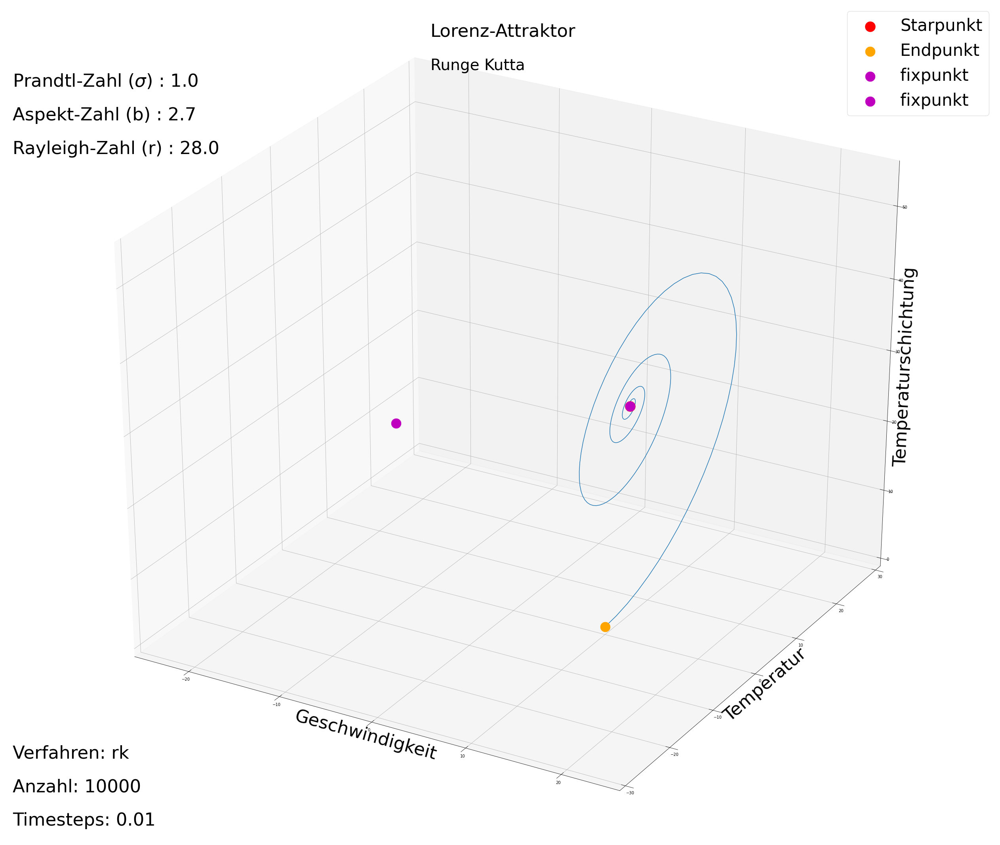

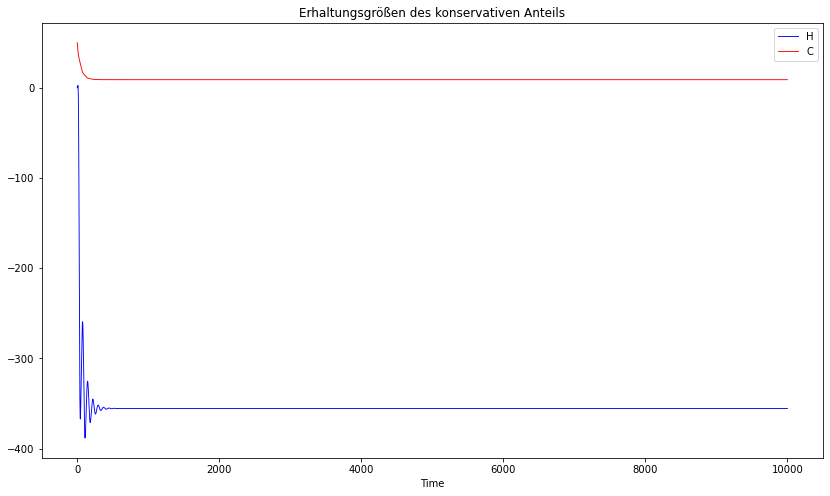

In [34]:
lorenz_rk(sig=1)

### sig=100

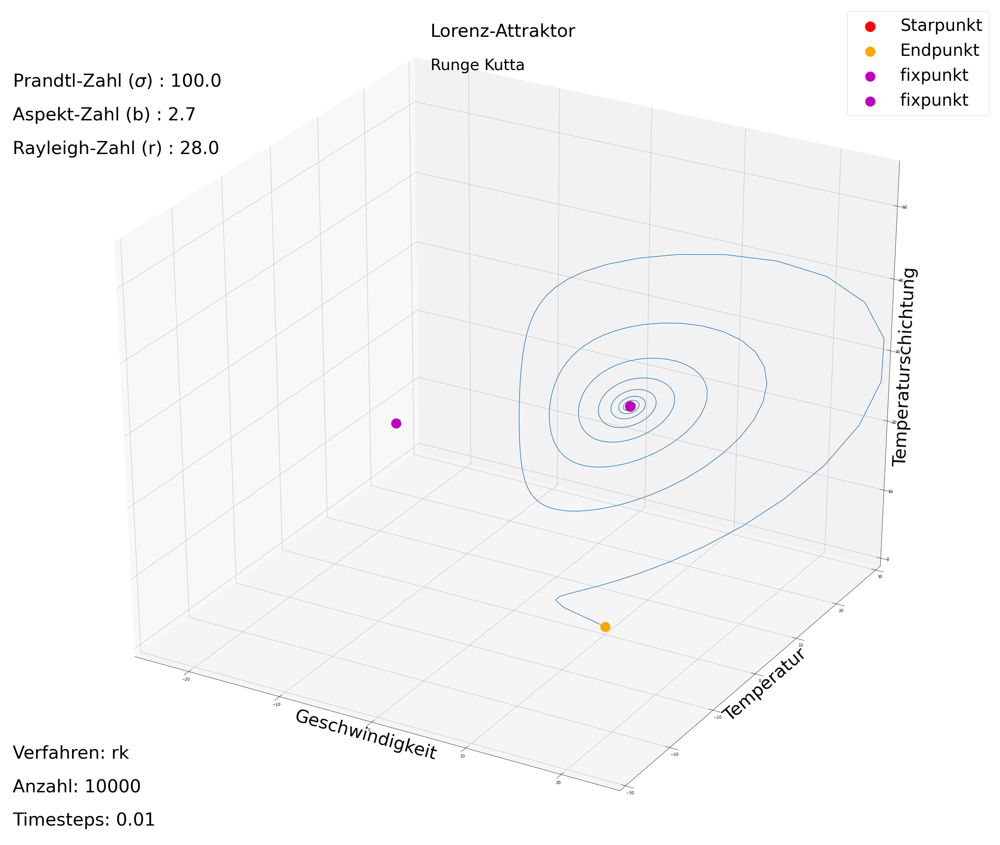

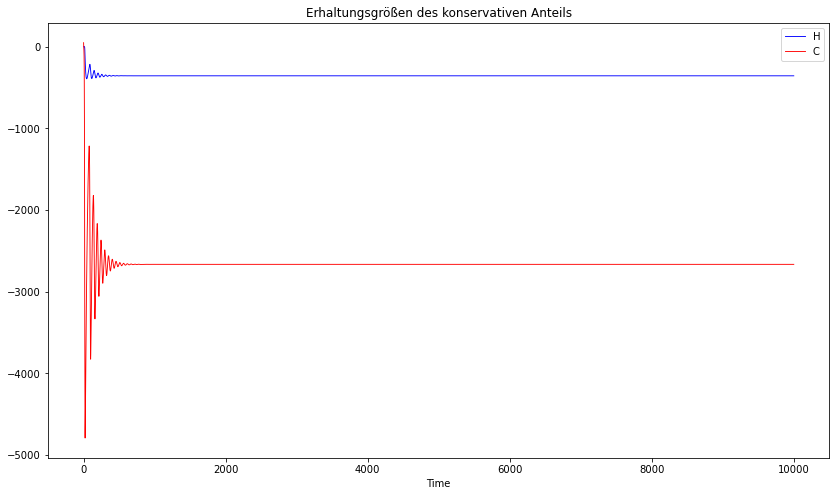

In [35]:
lorenz_rk(sig=100)

### sig=19

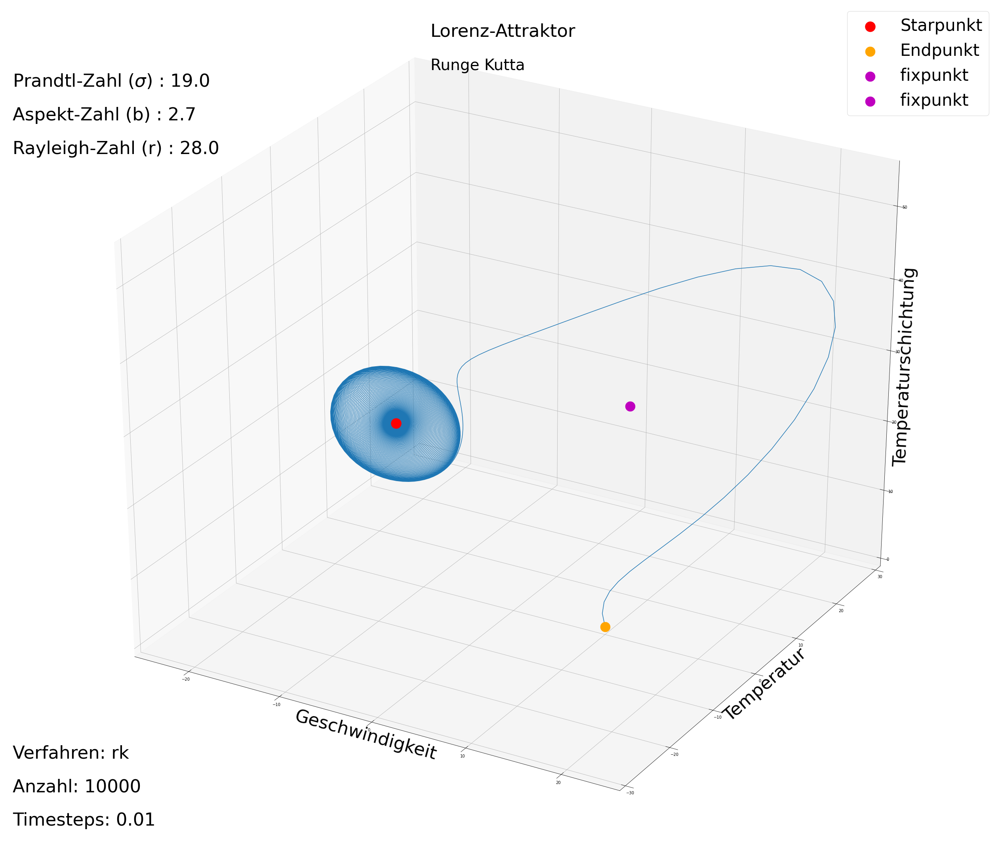

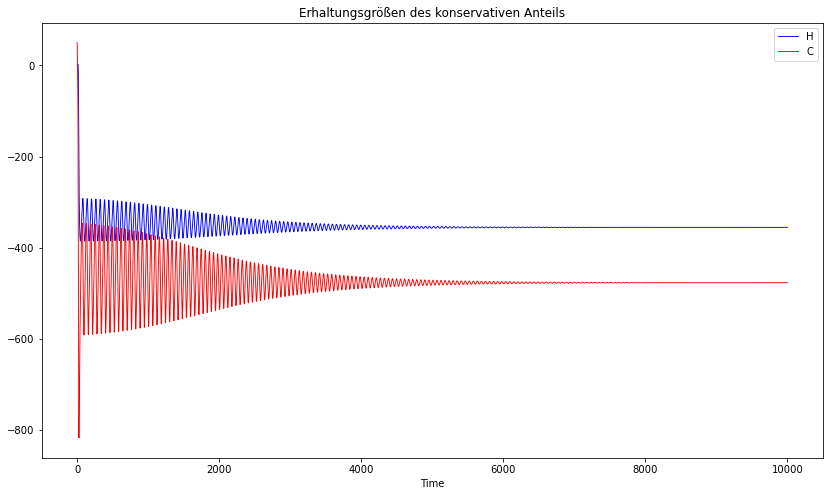

In [39]:
lorenz_rk(sig=19)

## Rayleigh-Zahl
beschreibt den Charakter der Wärmeübertragung innerhalb eines Fluids.

\begin{equation}
R_a ~=~Gr~Pr
\end{equation}
$Gr$ : Grashof-Zahl : Verhältnis des statischen Auftriebs eines Fluids zu der auf das Fluid wirkenden Kraft durch Viskosität an, multipliziert mit dem Verhältnis der Trägheitskraft zur viskosen Kraft

-wenn die Rayleigh-Zahl einen kritischen Wert für das Fluid übersteigt, ist die Wärmeübertragung primär durch Konvektion gegeben.

-wenn sie unterhalb des kritischen Wertes bleibt, ist die Wärmeübertragung primär durch Wärmeleitung gegeben.

### r=20

In [ ]:
lorenz_euler(r=20)

### r=15.3

In [ ]:
lorenz_euler(r=15.3)

### r=15.3878

In [ ]:
lorenz_euler(=15.3878)